In [ ]:
!python -m pip install prophet
!pip install plotly==5.9.0


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:

from prophet import Prophet

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
+from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

customers = pd.read_csv("/content/drive/MyDrive/Copy of olist_customers_dataset.csv")
1
geolocation = pd.read_csv("/content/drive/MyDrive/Copy of olist_geolocation_dataset (1).csv")
order_items = pd.read_csv("/content/drive/MyDrive/Copy of olist_order_items_dataset.csv")
order_payments = pd.read_csv("/content/drive/MyDrive/Copy of olist_order_payments_dataset.csv")
order_reviews = pd.read_csv("/content/drive/MyDrive/Copy of olist_order_reviews_dataset.csv") # null value exist 
orders= pd.read_csv("/content/drive/MyDrive/Copy of olist_orders_dataset.csv") # null value exist 
products = pd.read_csv("/content/drive/MyDrive/Copy of olist_products_dataset.csv") # null value exist 
sellers = pd.read_csv("/content/drive/MyDrive/Copy of olist_sellers_dataset.csv")
product_category_name_translation = pd.read_csv("/content/drive/MyDrive/Copy of product_category_name_translation.csv")


In [ ]:
df =pd.merge(orders,order_payments,on = 'order_id')


In [ ]:
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,1,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,1,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,1,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,boleto,1,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1,credit_card,3,179.12


In [ ]:
df.shape

(100739, 12)

In [ ]:
df.describe()

,payment_sequential,payment_installments,payment_value
count,100739.000000,100739.000000,100739.000000
mean,1.088387,2.851894,153.065673
std,0.652783,2.684496,214.465614
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.780000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.290000
max,26.000000,24.000000,13664.080000


In [ ]:
df.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 175
order_delivered_carrier_date     1888
order_delivered_customer_date    3132
order_estimated_delivery_date       0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
dtype: int64

In [ ]:
df =df.dropna()

In [ ]:
df.isnull().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
dtype: int64

In [ ]:
#count_of_payment = df['payment_value'].value_counts()
#count_of_payment

In [ ]:
#df["total_payment_by_Date"] = count_of_payment*count_of_payment.index

In [ ]:
df.head(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,1,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,1,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,1,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,boleto,1,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1,credit_card,3,179.12


In [ ]:
df10= df[["order_delivered_customer_date","payment_value"]].groupby('order_delivered_customer_date').sum().reset_index()

In [ ]:
df10.head()

,order_delivered_customer_date,payment_value
0,2016-10-11 13:46:32,101.44
1,2016-10-11 14:46:49,111.51
2,2016-10-13 03:10:34,40.79
3,2016-10-13 07:45:48,161.65
4,2016-10-13 15:44:27,315.24


In [ ]:

df10.dtypes

order_delivered_customer_date     object
payment_value                    float64
dtype: object

In [ ]:
df10.isnull().sum()

order_delivered_customer_date    0
payment_value                    0
dtype: int64

In [ ]:
#df10.total_payment_by_Date.hist(bins=2000)


In [ ]:
df10.columns = ['ds','y']

In [ ]:
df10.dtypes

ds     object
y     float64
dtype: object

In [ ]:
df10['ds']= pd.to_datetime(df10['ds'])
df10.head()

,ds,y
0,2016-10-11 13:46:32,101.44
1,2016-10-11 14:46:49,111.51
2,2016-10-13 03:10:34,40.79
3,2016-10-13 07:45:48,161.65
4,2016-10-13 15:44:27,315.24


In [ ]:
df10.dtypes

ds    datetime64[ns]
y            float64
dtype: object

In [ ]:
m = Prophet()
m.fit(df10)

DEBUG:cmdstanpy:input tempfile: /tmp/tmp35m3soen/gtlanak8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp35m3soen/tnlv135g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=86299', 'data', 'file=/tmp/tmp35m3soen/gtlanak8.json', 'init=/tmp/tmp35m3soen/tnlv135g.json', 'output', 'file=/tmp/tmp35m3soen/prophet_modelkc3q71do/prophet_model-20221118125332.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
12:53:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
12:53:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
future1 = m.make_future_dataframe(periods = 1095)
future1.tail()

,ds
96738,2021-10-12 13:22:46
96739,2021-10-13 13:22:46
96740,2021-10-14 13:22:46
96741,2021-10-15 13:22:46
96742,2021-10-16 13:22:46


In [ ]:
forecast1 = m.predict(future1)
forecast1[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
96738,2021-10-12 13:22:46,160.466926,-236.735671,586.441289
96739,2021-10-13 13:22:46,160.676988,-234.968226,578.411986
96740,2021-10-14 13:22:46,158.631584,-263.652710,578.246176
96741,2021-10-15 13:22:46,162.201779,-239.764754,579.187449
96742,2021-10-16 13:22:46,162.818089,-252.471930,549.460205


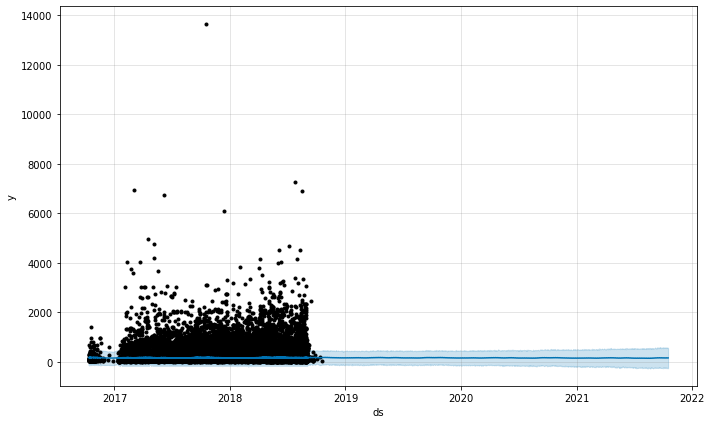

In [ ]:
fig1 = m.plot(forecast1)

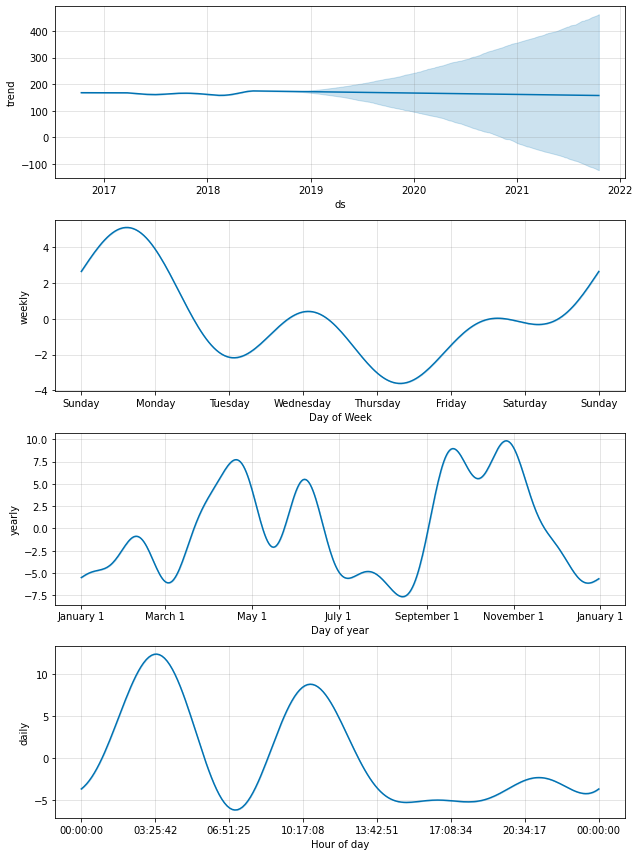

In [ ]:
fig2 = m.plot_components(forecast1)

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m,forecast1)

In [ ]:
plot_components_plotly(m,forecast1)